In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import libraries
import numpy as np 
import pandas as pd 
import cv2
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from scipy.optimize import minimize
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '/content/drive/MyDrive/pku-autonomous-driving/'
os.listdir(PATH)

['sample_submission.csv',
 'train_masks',
 'car_models',
 'camera',
 'test_masks',
 'train_images',
 'test_images',
 'car_models_json',
 'model.pth',
 'model_epoch0.pth',
 'model_epoch1.pth',
 'model_epoch2.pth',
 'model_epoch3.pth',
 'model_epoch4.pth',
 'model_epoch5.pth',
 'model_epoch6.pth',
 'model_epoch7.pth',
 'model_epoch8.pth',
 'model_epoch9.pth',
 'im',
 'model_epoch_foggy0.pth',
 'model_epoch_foggy1.pth',
 'model_epoch_foggy2.pth',
 'model_epoch_foggy3.pth',
 'model_epoch_foggy4.pth',
 'model_epoch_foggy5.pth',
 'model_epoch_foggy6.pth',
 'model_epoch_foggy7.pth',
 'model_epoch_foggy8.pth',
 'model_epoch_foggy9.pth',
 'train.csv',
 'model_epoch_foggy_new_data0.pth',
 'model_epoch_foggy_new_data1.pth',
 'model_epoch_foggy_new_data2.pth',
 'model_epoch_foggy_new_data3.pth',
 'model_epoch_foggy_new_data4.pth']

In [ ]:
# create train and test sets
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


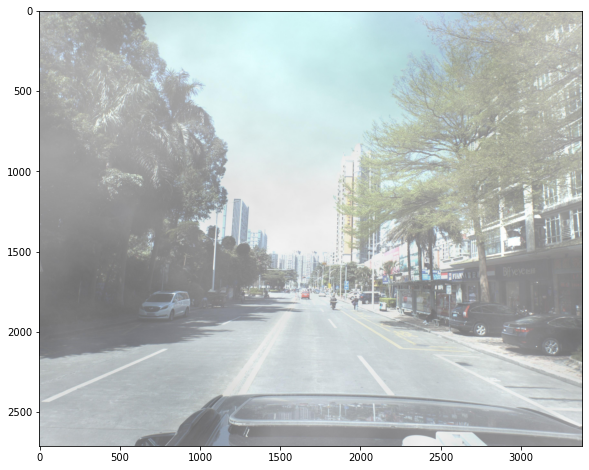

In [ ]:
# defines imread
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'im/ID_8a6e65317' + '.jpg') #'train_images/ID_8a6e65317' + '.jpg'
IMG_SHAPE = img.shape

plt.figure(figsize=(15,8))
plt.imshow(img);

In [ ]:
# convert coordinates to legible string
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [ ]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print(len(train))
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323
4264
Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



11.652673545966229


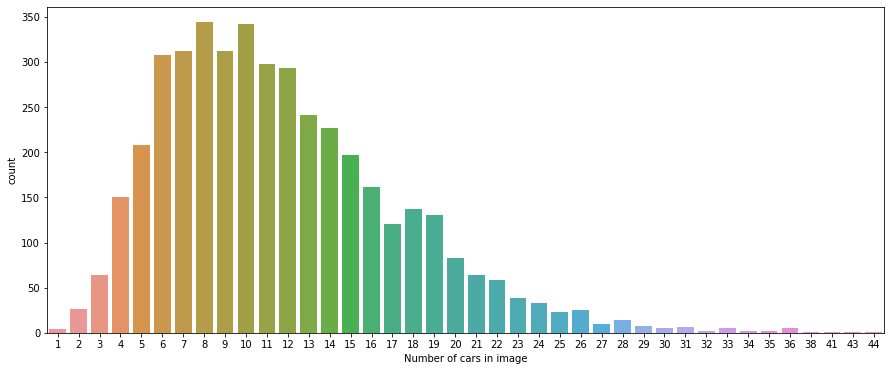

In [ ]:
# number of cars in an image histogram
lens = [len(str2coords(s)) for s in train['PredictionString']]

plt.figure(figsize=(15,6))
sns.countplot(lens);
plt.xlabel('Number of cars in image');
print(np.mean(lens))

In [ ]:
points_df = pd.DataFrame()
for col in ['x', 'y', 'z', 'yaw', 'pitch', 'roll']:
    arr = []
    for ps in train['PredictionString']:
        coords = str2coords(ps)
        arr += [c[col] for c in coords]
    points_df[col] = arr

print('len(points_df)', len(points_df))
points_df.head()

len(points_df) 49687


,x,y,z,yaw,pitch,roll
0,7.96539,3.20066,11.0225,0.254839,-2.57534,-3.10256
1,9.60332,4.66632,19.3390,0.181647,-1.46947,-3.12159
2,10.39000,11.22190,59.7825,0.163072,-1.56865,-3.11754
3,-9.59236,5.13662,24.7337,0.141942,-3.13950,3.11969
4,9.83335,13.26890,72.9323,0.163068,-2.08578,-3.11754


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



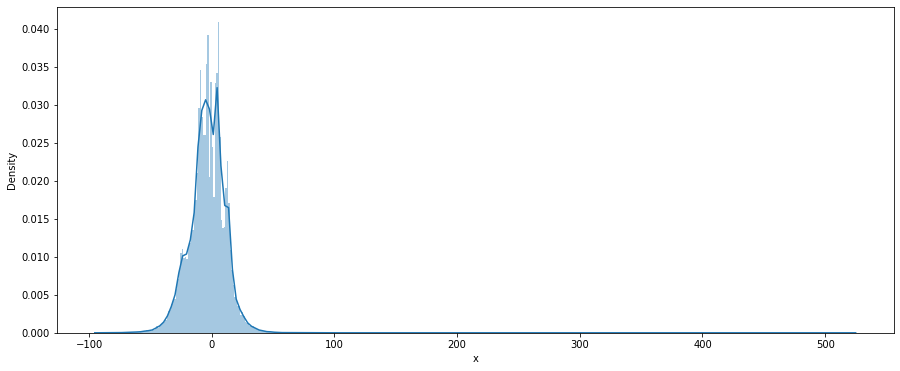

In [ ]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['x'], bins=500);
plt.xlabel('x')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



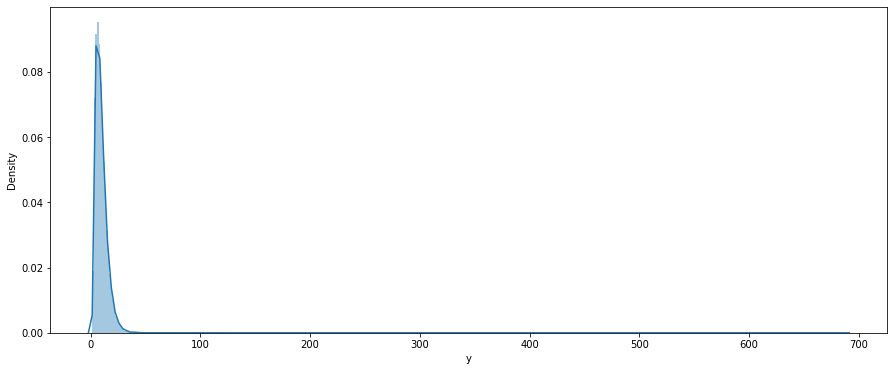

In [ ]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['y'], bins=500);
plt.xlabel('y')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



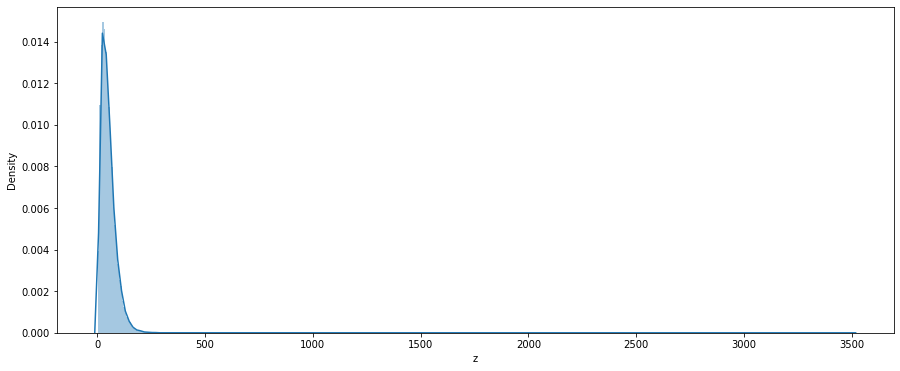

In [ ]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['z'], bins=500);
plt.xlabel('z')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



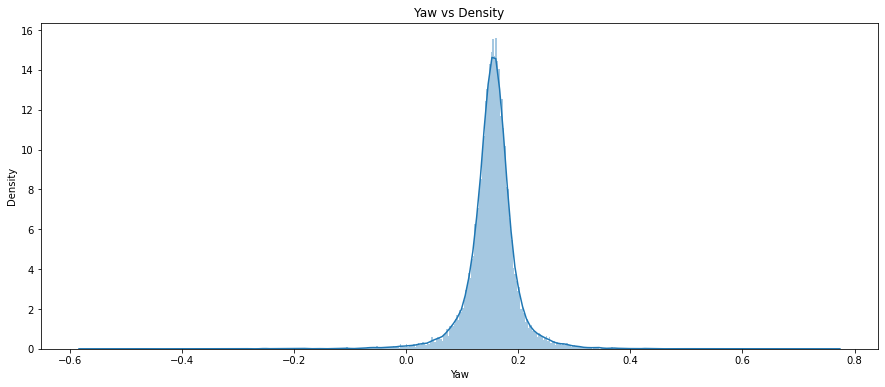

In [ ]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['yaw'], bins=500);
plt.xlabel('Yaw')
plt.title('Yaw vs Density')
plt.savefig('yaw.pdf')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



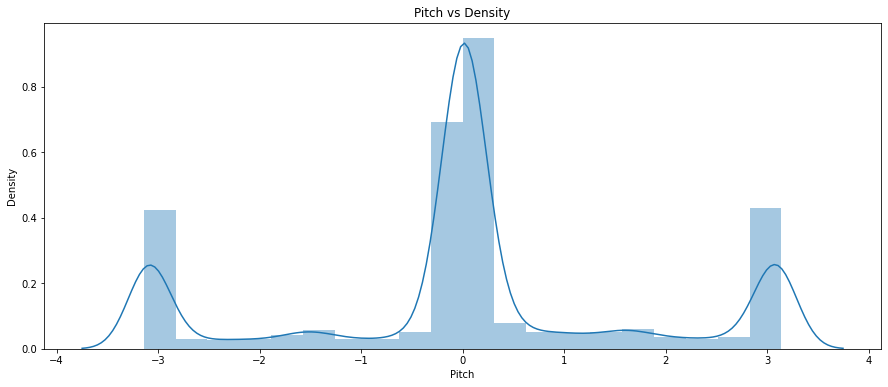

In [ ]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['pitch'], bins=20);
plt.xlabel('Pitch')
plt.title('Pitch vs Density')
plt.savefig('pitch.pdf')
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



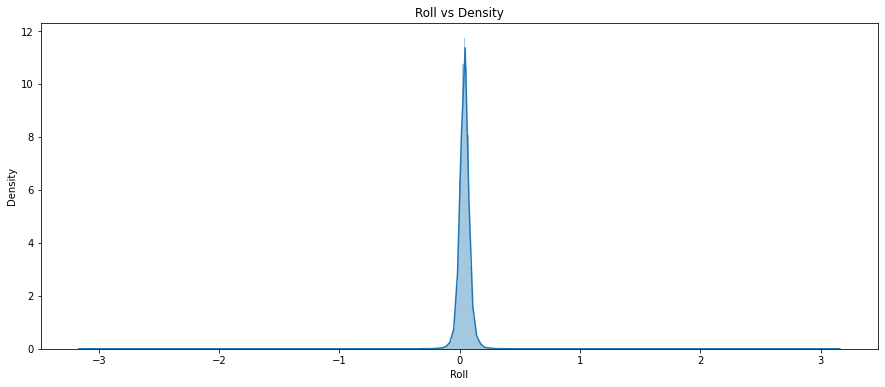

In [ ]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

plt.figure(figsize=(15,6))
sns.distplot(points_df['roll'].map(lambda x: rotate(x, np.pi)), bins=500);
plt.xlabel('Roll')
plt.title('Roll vs Density')
plt.savefig('roll.pdf')
plt.show()

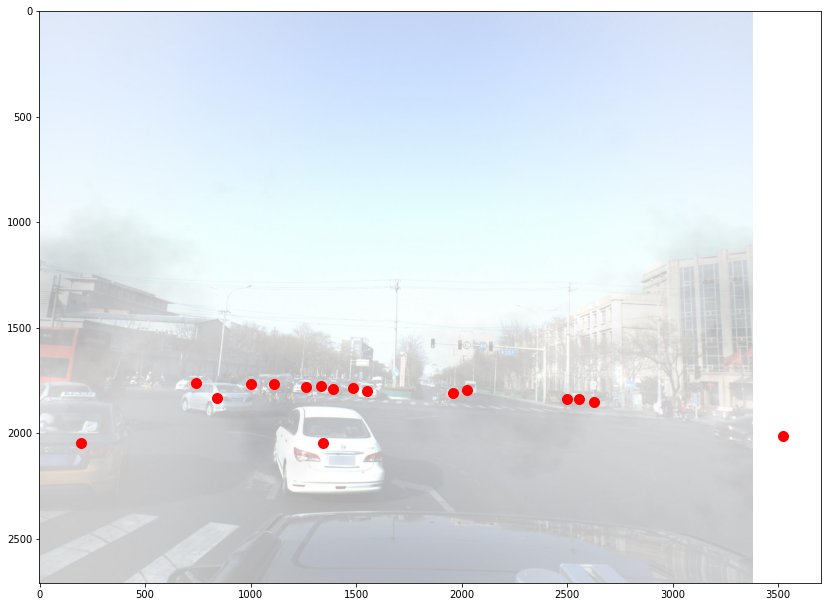

In [ ]:
# inputs prediction string and outputs x and y coordinates
def get_img_coords(s):
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

plt.figure(figsize=(14,14))
plt.imshow(imread(PATH + 'im/' + train['ImageId'][2217] + '.jpg')) # 'train_images/'
plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

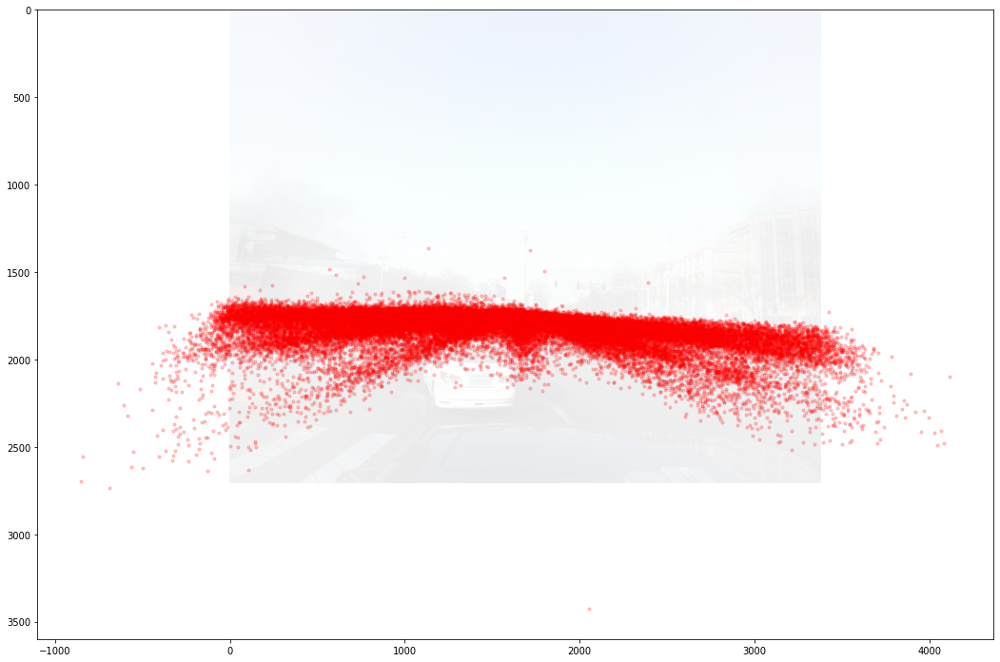

In [ ]:
xs, ys = [], []

for ps in train['PredictionString']:
    x, y = get_img_coords(ps)
    xs += list(x)
    ys += list(y)

plt.figure(figsize=(18,18))
plt.imshow(imread(PATH + 'im/' + train['ImageId'][2217] + '.jpg'), alpha=0.3) # 'train_images/'
plt.scatter(xs, ys, color='red', s=10, alpha=0.2);

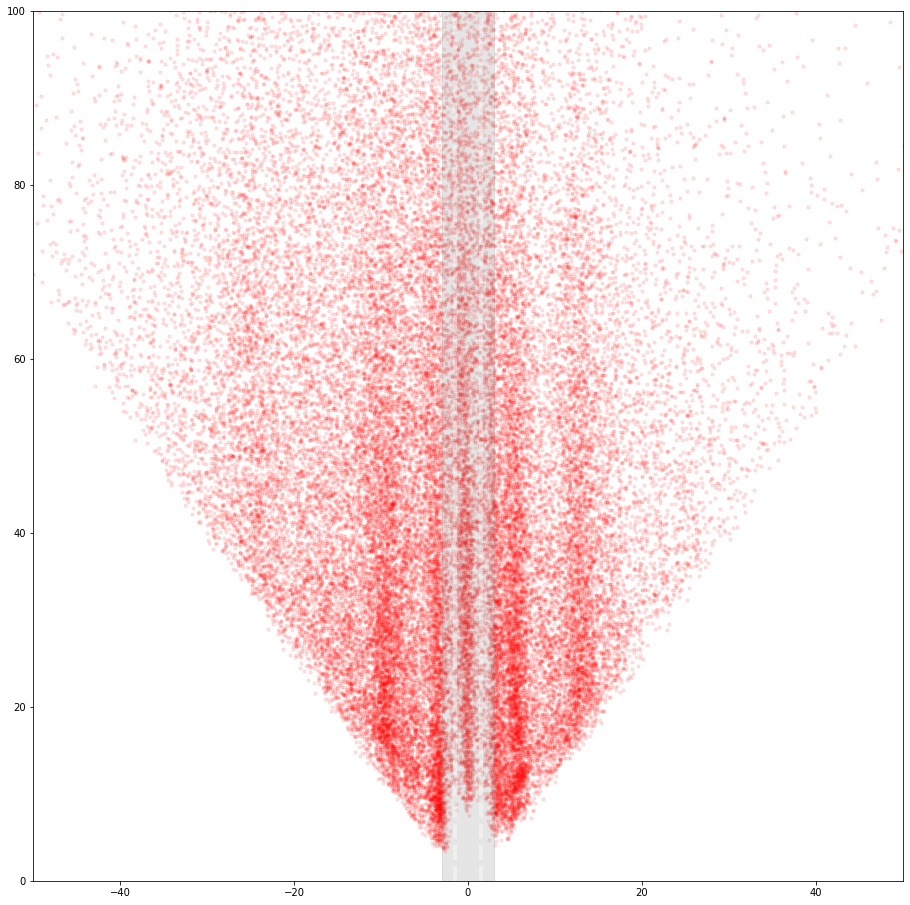

In [ ]:
# Road points
road_width = 3
road_xs = [-road_width, road_width, road_width, -road_width, -road_width]
road_ys = [0, 0, 500, 500, 0]

plt.figure(figsize=(16,16))
plt.axes().set_aspect(1)
plt.xlim(-50,50)
plt.ylim(0,100)

# View road
plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
plt.plot([road_width/2,road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
plt.plot([-road_width/2,-road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# View cars
plt.scatter(points_df['x'], np.sqrt(points_df['z']**2 + points_df['y']**2), color='red', s=10, alpha=0.1);

In [ ]:
fig = px.scatter_3d(points_df, x='x', y='y', z='z',color='pitch', range_x=(-50,50), range_y=(0,50), range_z=(0,250), opacity=0.1)
fig.show()

In [ ]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [ ]:
# Draw bounding box
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16) #16
    cv2.line(image, tuple(points[1][:2]), tuple(points[4][:2]), color, 16) #16..

    cv2.line(image, tuple(points[1][:2]), tuple(points[5][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[6][:2]), color, 16)
    cv2.line(image, tuple(points[3][:2]), tuple(points[4][:2]), color, 16)
    cv2.line(image, tuple(points[3][:2]), tuple(points[7][:2]), color, 16)

    cv2.line(image, tuple(points[4][:2]), tuple(points[8][:2]), color, 16)
    cv2.line(image, tuple(points[5][:2]), tuple(points[8][:2]), color, 16)

    cv2.line(image, tuple(points[5][:2]), tuple(points[6][:2]), color, 16)
    cv2.line(image, tuple(points[6][:2]), tuple(points[7][:2]), color, 16)
    cv2.line(image, tuple(points[7][:2]), tuple(points[8][:2]), color, 16)
    return image


# draw centre point
def draw_points(image, points):
    image=np.array(image)
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y),30, (0, 255, 0), -1)
        if p_x > image.shape[1] or p_y > image.shape[0]:
            print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [ ]:
# visualizes the coordinates allowing for bounding box visualisation
def visualize(img, coords):

    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[0, 0, 0, 1],
                  [x_l, y_l, -z_l, 1],
                  [x_l, y_l, z_l, 1],
                  [-x_l, y_l, z_l, 1],
                  [-x_l, y_l, -z_l, 1],
                  [x_l, -y_l, -z_l, 1],
                  [x_l, -y_l, z_l, 1],
                  [-x_l, -y_l, z_l, 1],
                  [-x_l, -y_l, -z_l, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[0:1])
    
    return img

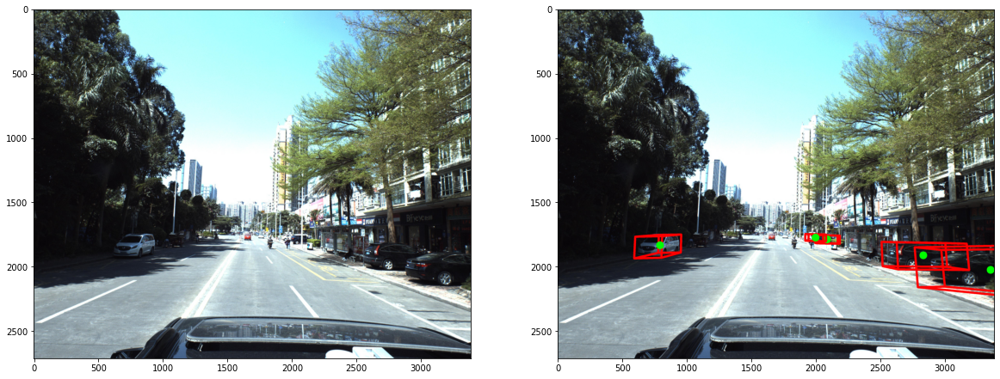

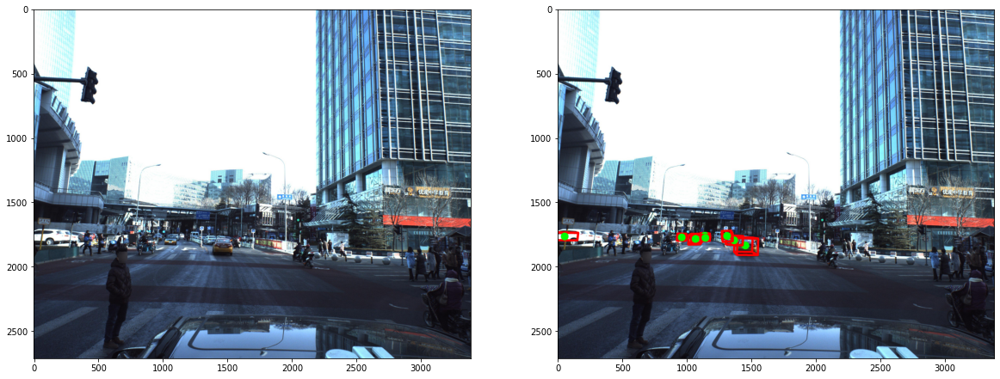

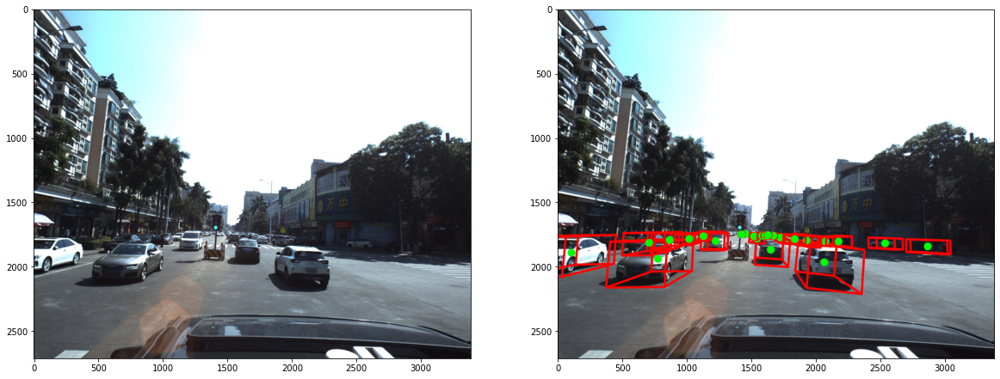

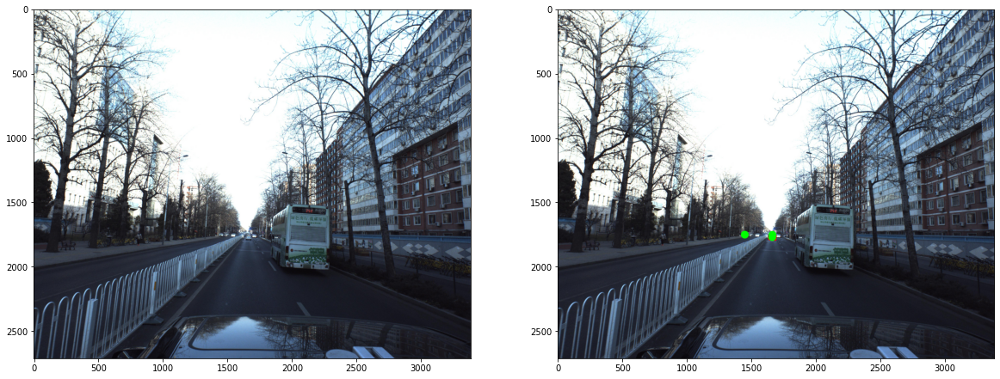

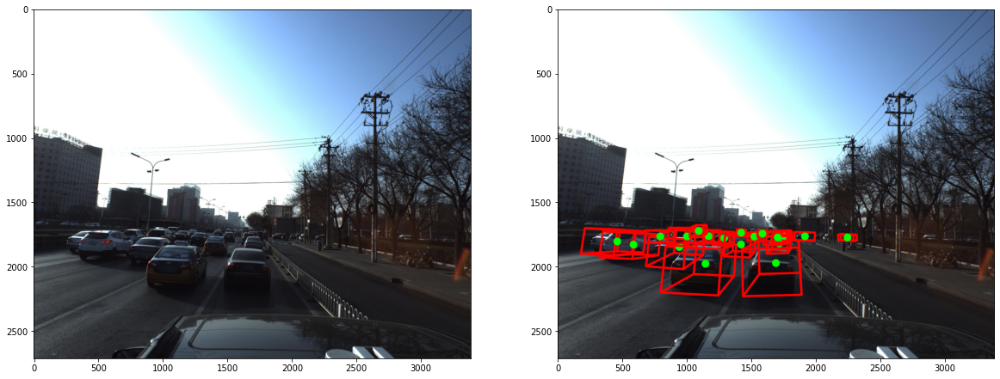

Point 3432 1943 is out of image with shape (2710, 3384, 3)


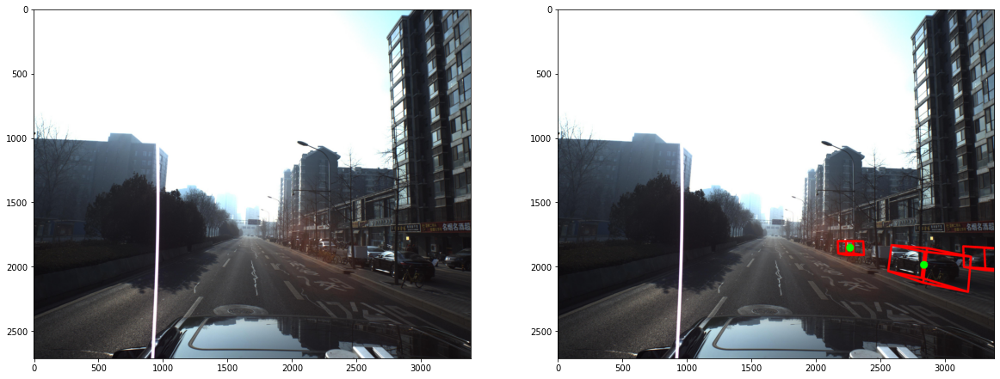

In [ ]:
n_rows = 6

for idx in range(n_rows):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg') # 'train_images/'
    axes[0].imshow(img)
    img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
    axes[1].imshow(img_vis)
    plt.show()

In [ ]:
IMG_WIDTH = 1024
IMG_HEIGHT = IMG_WIDTH // 16 * 5
MODEL_SCALE = 8

def _regr_preprocess(regr_dict, flip=False):
    if flip:
        for k in ['x', 'pitch', 'roll']:
            regr_dict[k] = -regr_dict[k]
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img, flip=False):
    try:
      img = img[img.shape[0] // 2:]
      bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
      bg = bg[:, :img.shape[1] // 6]
      img = np.concatenate([bg, img, bg], 1)
      img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
      if flip:
          img = img[:,::-1]
      return (img / 255).astype('float32')
    except:
      print(img)

def get_mask_and_regr(img, labels, flip=False):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 6) * IMG_WIDTH / (img.shape[1] * 4/3) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict, flip)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    if flip:
        mask = np.array(mask[:,::-1])
        regr = np.array(regr[:,::-1])
    return mask, regr

img.shape (320, 1024, 3) std: 0.13101964
mask.shape (40, 128) std: 0.031234737
regr.shape (40, 128, 7) std: 0.013211883


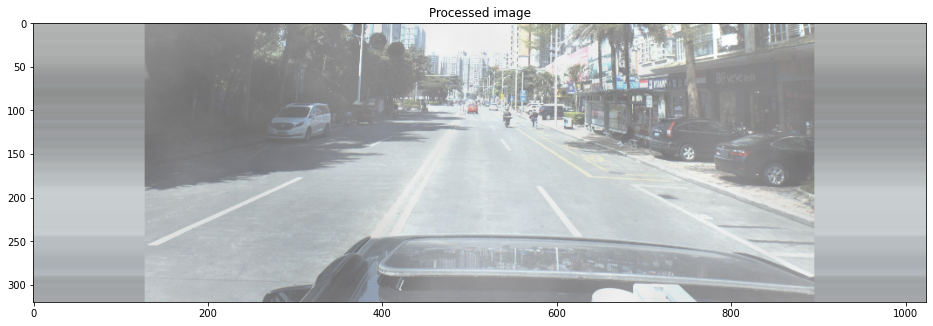

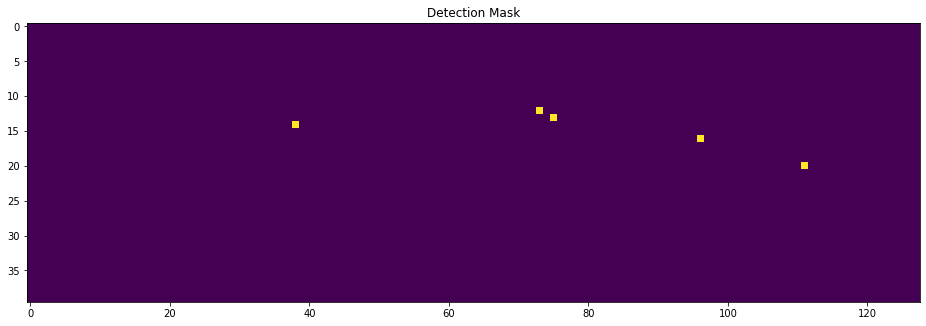

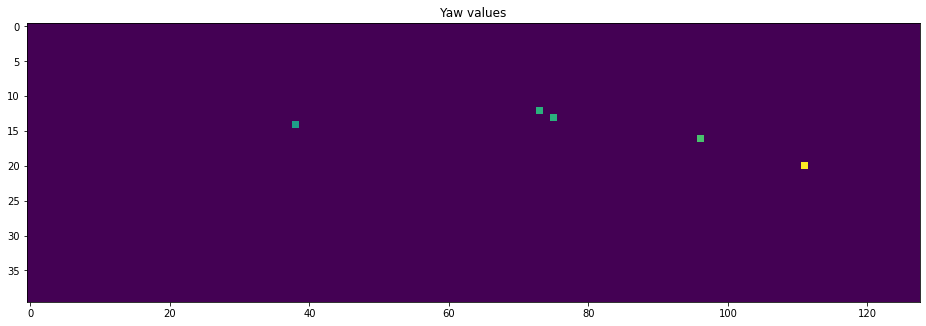

In [ ]:
img0 = imread(PATH + 'im/' + train['ImageId'][0] + '.jpg') # 'train_images/'
img = preprocess_image(img0)

mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

print('img.shape', img.shape, 'std:', np.std(img))
print('mask.shape', mask.shape, 'std:', np.std(mask))
print('regr.shape', regr.shape, 'std:', np.std(regr))

plt.figure(figsize=(16,16))
plt.title('Processed image')
plt.imshow(img)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Detection Mask')
plt.imshow(mask)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Yaw values')
plt.imshow(regr[:,:,-2])
plt.show()

In [ ]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):

    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0, flipped=False):
    def distance_fn(xyz):
        x, y, z = xyz
        xx = -x if flipped else x
        slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
        x, y = convert_3d_to_2d(x, y, z)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
        return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z_new

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def extract_coords(prediction, flipped=False):
    logits = prediction[0]
    regr_output = prediction[1:]
    points = np.argwhere(logits > 0)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r, c in points:
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = \
                optimize_xy(r, c,
                            coords[-1]['x'],
                            coords[-1]['y'],
                            coords[-1]['z'], flipped)
    coords = clear_duplicates(coords)
    return coords

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

In [ ]:
xzy_slope = LinearRegression()
X = points_df[['z']]
y = points_df['y']
xzy_slope.fit(X, y)
print('MAE without x:', mean_absolute_error(y, xzy_slope.predict(X)))


xzy_slope = LinearRegression()
X = points_df[['x', 'z']]
y = points_df['y']
xzy_slope.fit(X, y)
print('MAE with x:', mean_absolute_error(y, xzy_slope.predict(X)))

print('\ndy/dx = {:.3f}\ndy/dz = {:.3f}'.format(*xzy_slope.coef_))

MAE without x: 0.6557870233244322
MAE with x: 0.4485974533987192

dy/dx = 0.051
dy/dz = 0.169


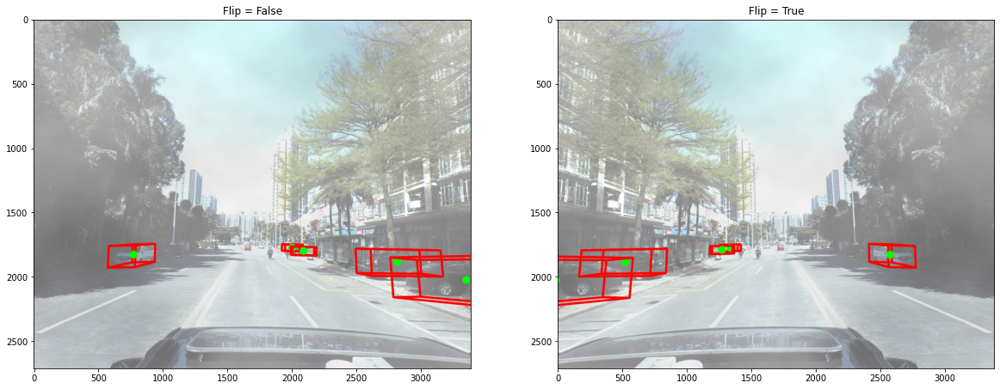

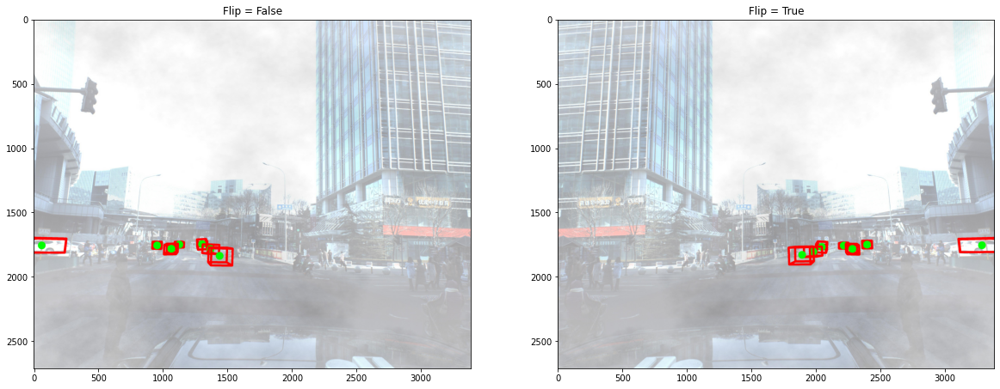

In [ ]:
for idx in range(2):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    
    for ax_i in range(2):
        img0 = imread(PATH + 'im/' + train['ImageId'].iloc[idx] + '.jpg') # 'train_images/'
        if ax_i == 1:
            img0 = img0[:,::-1]
        img = preprocess_image(img0, ax_i==1)
        mask, regr = get_mask_and_regr(img0, train['PredictionString'][idx], ax_i==1)
        regr = np.rollaxis(regr, 2, 0)
        coords = extract_coords(np.concatenate([mask[None], regr], 0), ax_i==1)
        
        axes[ax_i].set_title('Flip = {}'.format(ax_i==1))
        axes[ax_i].imshow(visualize(img0, coords))
    plt.show()


In [ ]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Augmentation
        flip = False
        if self.training:
            flip = np.random.randint(10) == 1
        
        # Read image
        img0 = imread(img_name, True)
        try:
          img = preprocess_image(img0, flip=flip)
          img = np.rollaxis(img, 2, 0)
        except:
          print(img_name)
        # Get mask and regression maps
        mask, regr = get_mask_and_regr(img0, labels, flip=flip)
        regr = np.rollaxis(regr, 2, 0)
        
        return [img, mask, regr]

In [ ]:
train_images_dir = PATH + 'train_images/{}.jpg' # 'train_images/'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir, training=True)
dev_dataset = CarDataset(df_dev, train_images_dir, training=False)
test_dataset = CarDataset(df_test, test_images_dir, training=False)



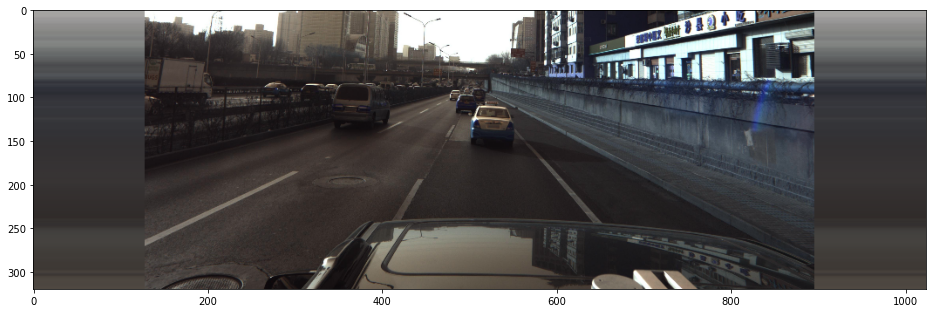

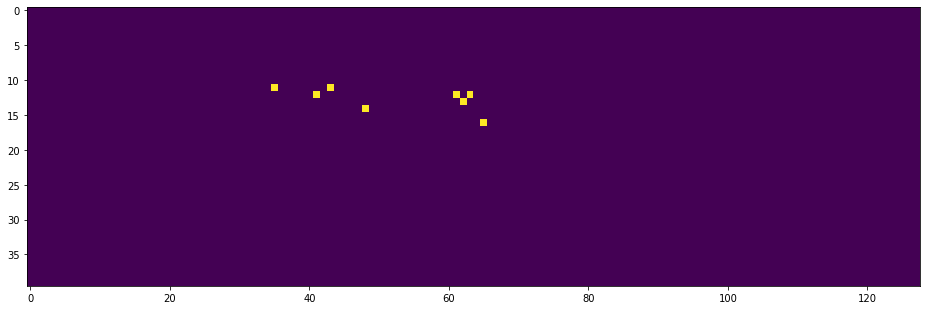

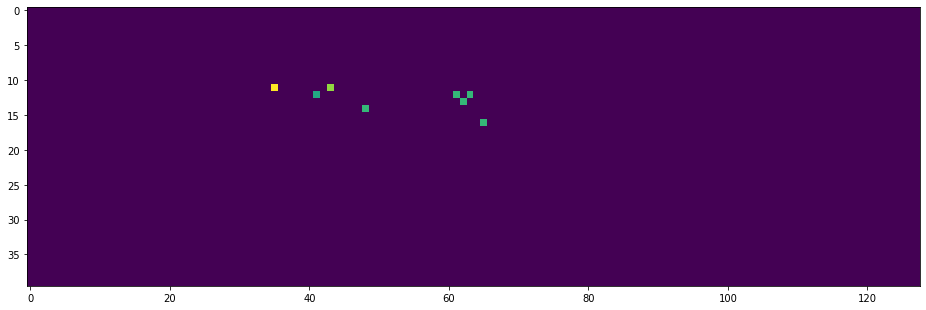

In [ ]:
img, mask, regr = train_dataset[0]

plt.figure(figsize=(16,16))
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(16,16))
plt.imshow(mask)
plt.show()

plt.figure(figsize=(16,16))
plt.imshow(regr[-2])
plt.show()

In [ ]:
BATCH_SIZE = 4

# Create data generators which produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

In [ ]:
!pip install --upgrade efficientnet-pytorch

  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=4c7fabefc5d5a71e55f2463d12296f5a751e487ad12dbd00e4857e5a89c293b3
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
Successfully built efficientnet-pytorch


In [ ]:
from efficientnet_pytorch import EfficientNet
class double_conv(nn.Module):
    # (conv => BN => ReLU) * 2
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

In [ ]:
class CenterNet(nn.Module):
    # Mixture of previous classes
    def __init__(self, n_classes):
        super(CenterNet, self).__init__()
        self.base_model = EfficientNet.from_pretrained('efficientnet-b0')
        
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 + 1024, 512)
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)

    def forward(self, x):
        batch_size = x.shape[0]
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        x0 = torch.cat([x, mesh1], 1)
        x1 = self.mp(self.conv0(x0))
        x2 = self.mp(self.conv1(x1))
        x3 = self.mp(self.conv2(x2))
        x4 = self.mp(self.conv3(x3))
        
        x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8]
        feats = self.base_model.extract_features(x_center)
        bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2], feats.shape[3] // 8]).to(device)
        feats = torch.cat([bg, feats, bg], 3)
        
        # Add positional info
        mesh2 = get_mesh(batch_size, feats.shape[2], feats.shape[3])
        feats = torch.cat([feats, mesh2], 1)
        
        x = self.up1(feats, x4)
        x = self.up2(x, x3)
        x = self.outc(x)
        return x

In [ ]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 5

model = CenterNet(8).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth



Loaded pretrained weights for efficientnet-b0


In [ ]:
def criterion(prediction, mask, regr, size_average=True):
    # Binary mask loss
    pred_mask = torch.sigmoid(prediction[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)
    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()
    
    # Regression L1 loss
    pred_regr = prediction[:, 1:]
    regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    regr_loss = regr_loss.mean(0)
    
    # Sum
    loss = mask_loss + regr_loss
    if not size_average:
        loss *= prediction.shape[0]
    return loss


In [ ]:
def train_model(epoch, history=None):
    model.train()

    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(tqdm(train_loader)):
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        loss = criterion(output, mask_batch, regr_batch)
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()
    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data))

def evaluate_model(epoch, history=None):
    model.eval()
    loss = 0
    
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            loss += criterion(output, mask_batch, regr_batch, size_average=False).data
    
    loss /= len(dev_loader.dataset)
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = loss.cpu().numpy()
    
    print('Dev loss: {:.4f}'.format(loss))

In [ ]:
%%time
import gc

history = pd.DataFrame()

for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train_model(epoch, history)
    evaluate_model(epoch, history)
    torch.save(model.state_dict(), '/content/drive/MyDrive/pku-autonomous-driving/model_epoch_'+ str (epoch) +'.pth')


100%|██████████| 1056/1056 [23:33<00:00,  1.34s/it]


Train Epoch: 0 	LR: 0.001000	Loss: 72.860695
Dev loss: 33.5507



100%|██████████| 1056/1056 [23:42<00:00,  1.35s/it]


Train Epoch: 1 	LR: 0.001000	Loss: 25.490112
Dev loss: 30.8777



100%|██████████| 1056/1056 [23:45<00:00,  1.35s/it]


Train Epoch: 2 	LR: 0.000100	Loss: 14.382572
Dev loss: 26.8238



100%|██████████| 1056/1056 [23:49<00:00,  1.35s/it]


Train Epoch: 3 	LR: 0.000100	Loss: 17.236929
Dev loss: 26.2453



100%|██████████| 1056/1056 [23:52<00:00,  1.36s/it]


Train Epoch: 4 	LR: 0.000100	Loss: 42.286304
Dev loss: 26.0790
CPU times: user 55min 25s, sys: 23min 17s, total: 1h 18min 42s
Wall time: 2h 13s


In [ ]:
pretrain_directory = '/content/drive/MyDrive/pku-autonomous-driving/model_epoch4.pth'
model.load_state_dict(torch.load(pretrain_directory))

<All keys matched successfully>

Text(0.5, 1.0, 'Training Loss v Number of Epochs')

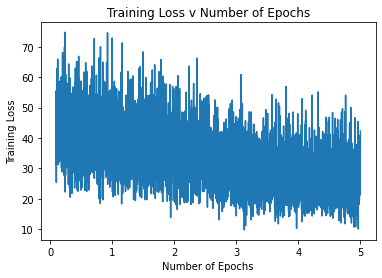

In [ ]:
history['train_loss'].iloc[100:].plot();
plt.xlabel('Number of Epochs')
plt.ylabel('Training Loss')
plt.title('Training Loss v Number of Epochs')

Text(0.5, 1.0, 'Validation Loss v Number of Epochs')

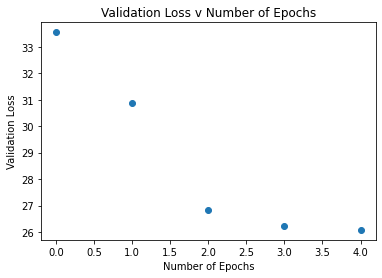

In [ ]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);
plt.xlabel('Number of Epochs')
plt.ylabel('Validation Loss')
plt.title('Validation Loss v Number of Epochs')

In [ ]:
compression_opts = dict(method='zip',
                        archive_name='out_foggy.csv')  

history.to_csv('out_foggy.zip', index=False,
          compression=compression_opts)  

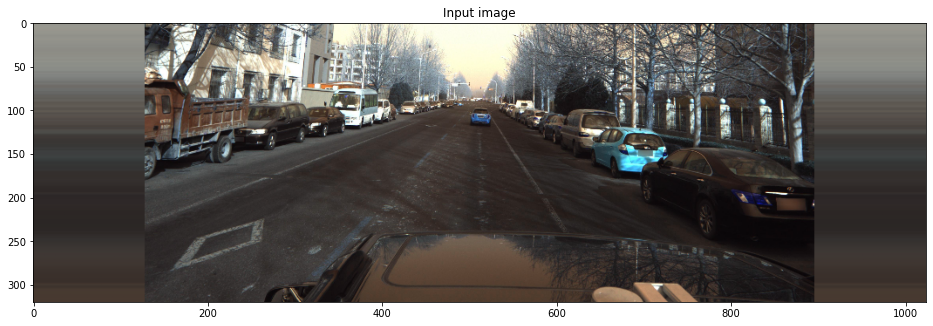

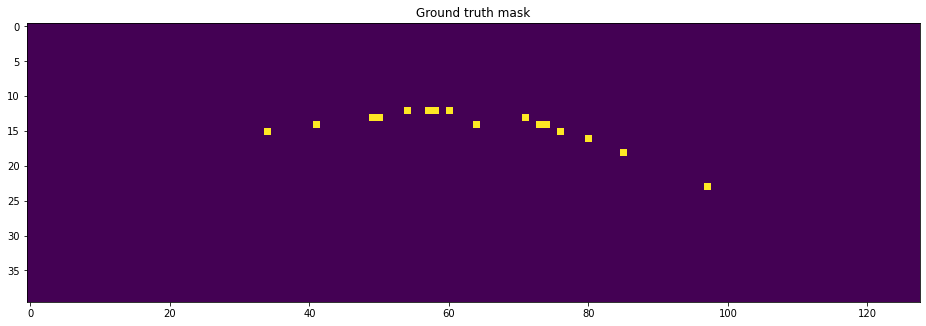

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning:

Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)



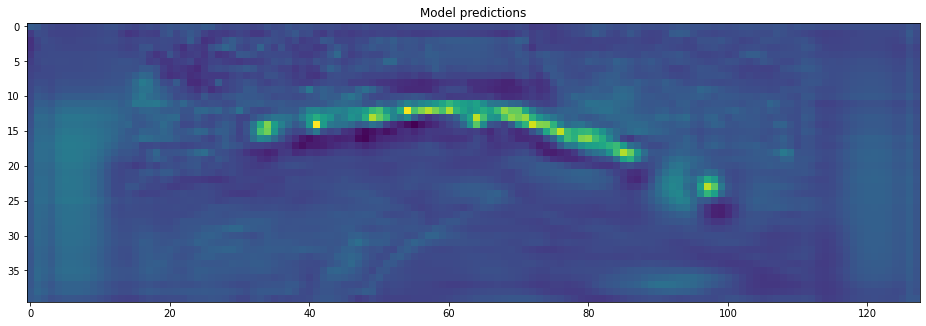

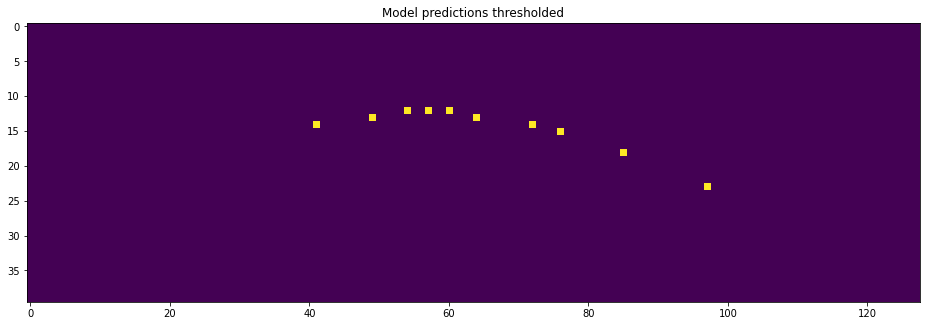

In [ ]:
img, mask, regr = dev_dataset[0]

plt.figure(figsize=(16,16))
plt.title('Input image')
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(16,16))
plt.title('Ground truth mask')
plt.imshow(mask)
plt.show()

output = model(torch.tensor(img[None]).to(device))
logits = output[0,0].data.cpu().numpy()

plt.figure(figsize=(16,16))
plt.title('Model predictions')
plt.imshow(logits)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Model predictions thresholded')
plt.imshow(logits > 0)
plt.show()

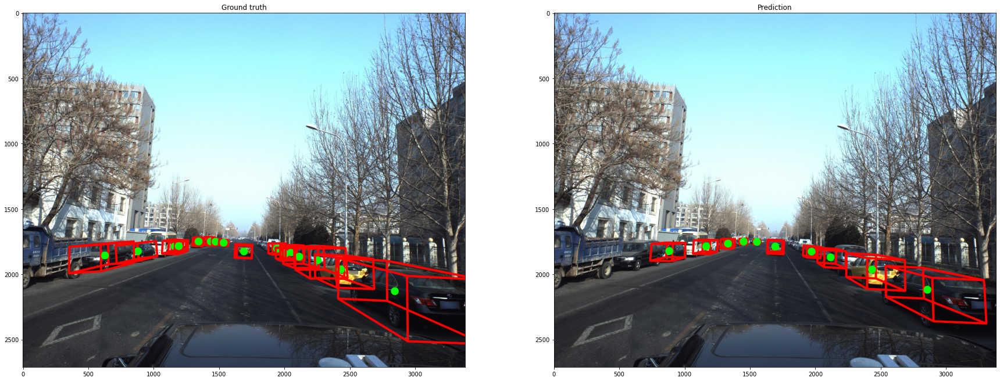

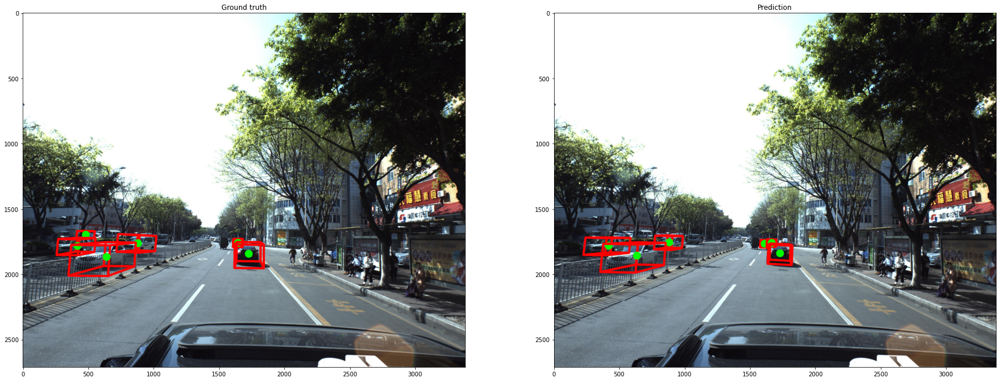

Point 3546 2369 is out of image with shape (2710, 3384, 3)


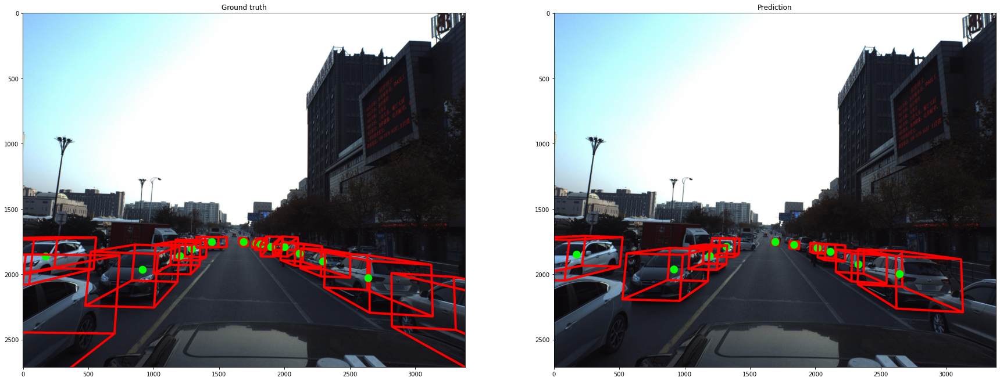

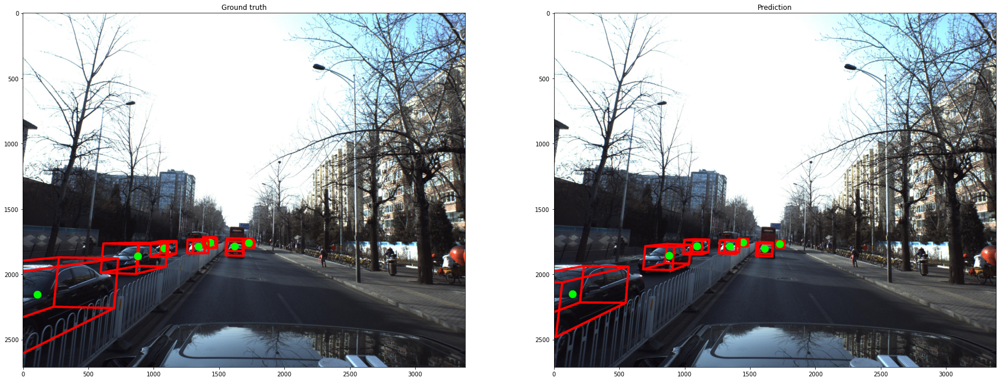

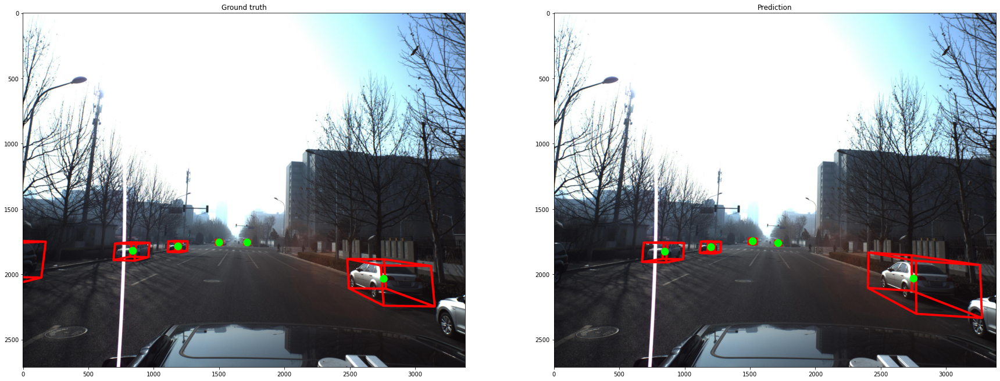

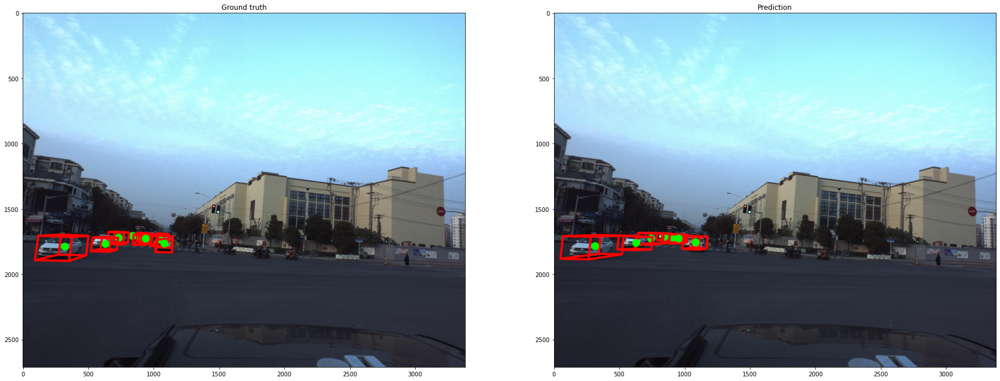

Point 3526 2085 is out of image with shape (2710, 3384, 3)


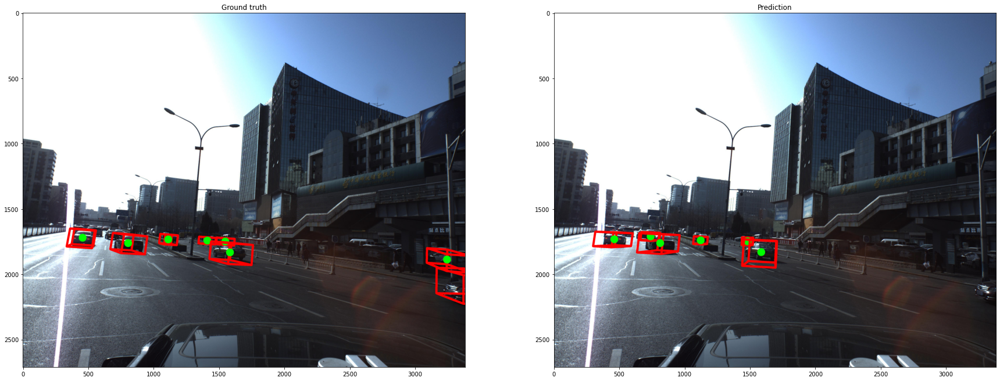

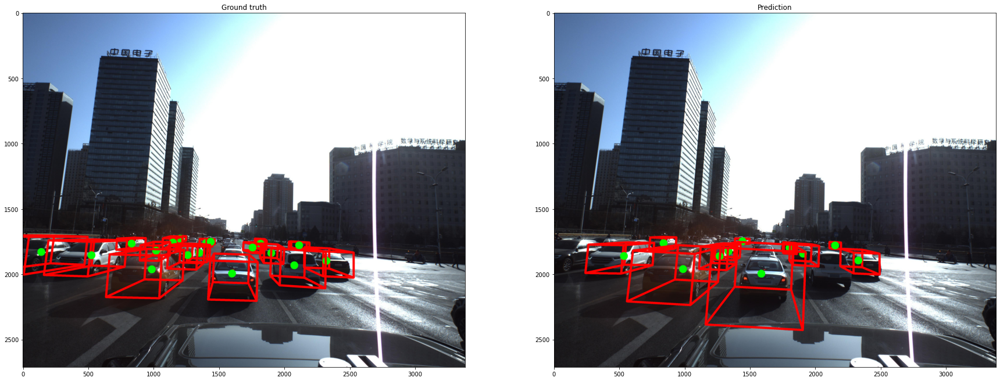

In [ ]:
torch.cuda.empty_cache()
# gc.collect()

for idx in range(8):
    img, mask, regr = dev_dataset[idx]
    
    output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
    coords_pred = extract_coords(output[0])
    coords_true = extract_coords(np.concatenate([mask[None], regr], 0))
    
    img = imread(train_images_dir.format(df_dev['ImageId'].iloc[idx]))
    
    fig, axes = plt.subplots(1, 2, figsize=(30,30))
    axes[0].set_title('Ground truth')
    axes[0].imshow(visualize(img, coords_true))
    axes[1].set_title('Prediction')
    axes[1].imshow(visualize(img, coords_pred))
    plt.show()

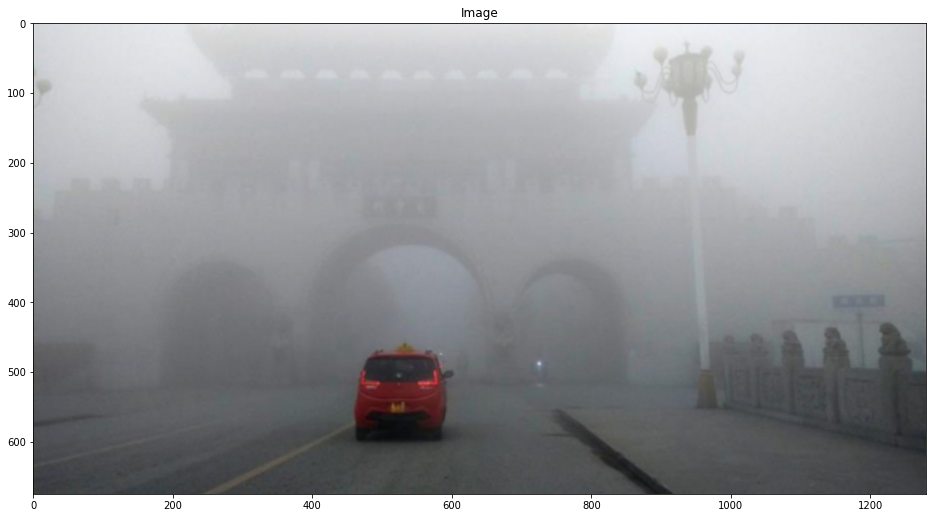

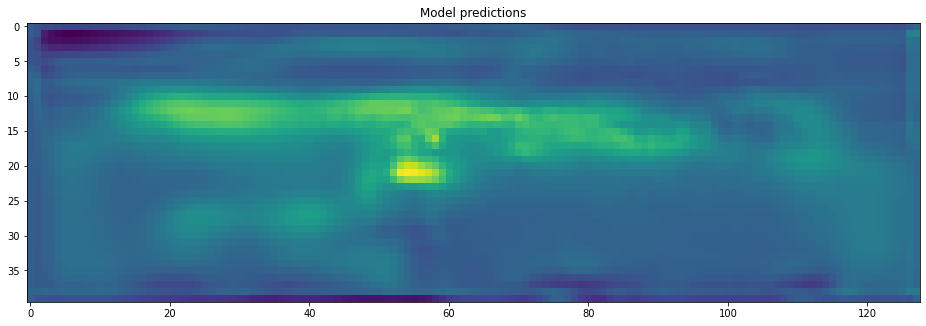

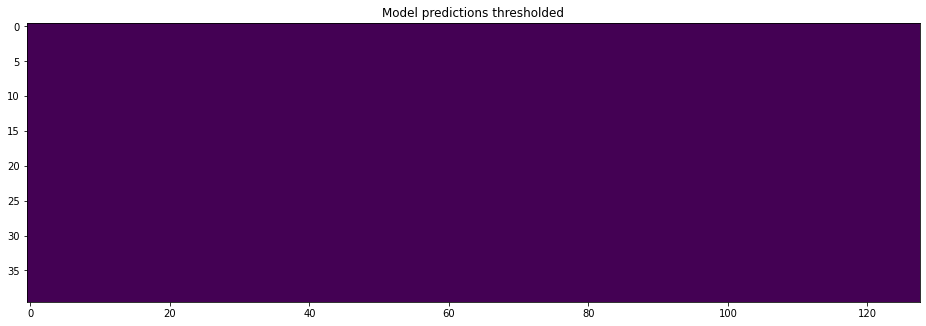

[]
(array([ 0,  0,  0, ..., 39, 39, 39]), array([  0,   1,   2, ..., 125, 126, 127]))


In [ ]:
from PIL import Image

test_dir = '/content/*.jpg'

test_dataset_1 = CarDataset(df_test, test_dir, training=False)

img_test, mask_test, regr_test = test_dataset_1[0]

output = model(torch.tensor(img_test[None]).to(device))
logits = output[0,0].data.cpu().numpy()

plt.figure(figsize=(16,16))
plt.title('Image')
plt.imshow(np.array(Image.open(test_dir)))
plt.show()

plt.figure(figsize=(16,16))
plt.title('Model predictions')
plt.imshow(logits)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Model predictions thresholded')
plt.imshow(logits > 0)
plt.show()

output = model(torch.tensor(img_test[None]).to(device)).data.cpu().numpy()
coords_pred = extract_coords(output[0])

print(coords_pred)
print(np.where(output[0,0]<0))


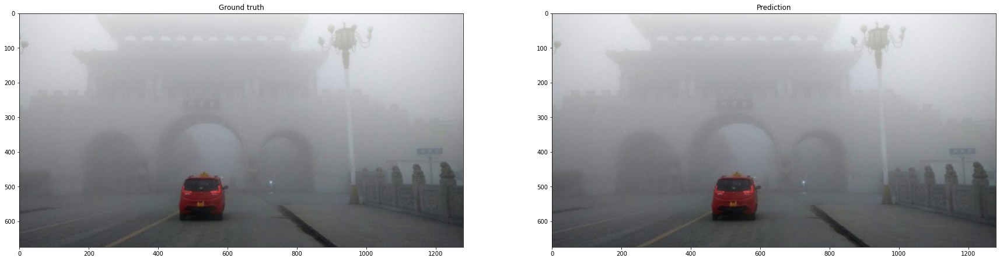

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(30,30))
axes[0].set_title('Ground truth')
axes[0].imshow(np.array(Image.open(test_dir)))
axes[1].set_title('Prediction')
axes[1].imshow(visualize(np.array(Image.open(test_dir)), coords_pred))
plt.show()

In [ ]:
# compare overlap between box0: [x, y, z, d] and box1: [x, y, z, d] 
def IoU(box0, box1):

  r0 = box0[3] / 2
  s0 = box0[:3] - r0
  e0 = box0[:3] + r0
  r1 = box1[3] / 2
  s1 = box1[:3] - r1
  e1 = box1[:3] + r1
  
  overlap = [max(0, min(e0[i], e1[i]) - max(s0[i], s1[i])) for i in range(3)]
  intersection = reduce(lambda x,y:x*y, overlap)
  union = pow(box0[3], 3) + pow(box1[3], 3) - intersection
  return intersection / union

In [ ]:
torch.cuda.empty_cache()
map_threshold = [0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95]
iou_arr = []
final_iou = []
final_map= []
for idx in range(0,len(dev_dataset)):
    img, mask, regr = dev_dataset[idx]
    
    output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
    coords_pred = extract_coords(output[0])
    coords_true = extract_coords(np.concatenate([mask[None], regr], 0))
    iou_arr = []
    for i in range(len(coords_pred)):
      for j in range(len(coords_true)):
        iou_arr.append(IoU([coords_pred[i]['x'],coords_pred[i]['y'],coords_pred[i]['z'],2*coords_pred[i]['z']],[coords_true[j]['x'],coords_true[j]['y'],coords_true[j]['z'],2*coords_true[j]['z']]))

    iou_arr = np.sort(iou_arr)[::-1][0:len(coords_pred)]
    print(iou_arr)
    print(np.sum(iou_arr)/len(coords_pred))
    final_iou.append(np.sum(iou_arr)/len(coords_pred))
    count = 0
    fp = 0
    fn = abs(len(coords_pred)-len(coords_true))
    for i in map_threshold:
      for j in iou_arr:
        if j>=i:
          count+=1
        else:
          fp+=1
        
    print(count/(count+fp+fn))
    final_map.append(count/(count+fp+fn))
    img = imread(train_images_dir.format(df_dev['ImageId'].iloc[idx]))
    
    fig, axes = plt.subplots(1, 2, figsize=(30,30))
    axes[0].set_title('Ground truth')
    axes[0].imshow(visualize(img, coords_true))
    axes[1].set_title('Prediction')
    axes[1].imshow(visualize(img, coords_pred))
    plt.show()
print(np.sum(final_iou)/len(dev_dataset))
print(np.sum(final_map)/len(dev_dataset))

[0.97201347 0.95853961 0.92828885 0.9235366  0.87548519 0.85800818
 0.84068237 0.82930041 0.8135559  0.77708183]
0.87764924224988
0.7641509433962265
[0.86893687 0.86889224 0.81094069 0.7308761  0.67466194 0.67380289]
0.771351789678777
0.6
[0.95381306 0.94582378 0.89504867 0.79938083 0.79461881 0.74589232
 0.73303706 0.681941   0.67947714 0.67773368]
0.79067663465059
0.580952380952381
[0.96697508 0.90752506 0.86667793 0.84319942 0.80787601 0.79436644
 0.79149466]
0.8540163738576594
0.7571428571428571
[0.95819618 0.78646654 0.78251775 0.70871623 0.6276312 ]
0.7727055794153428
0.5882352941176471
[0.98768568 0.98405874 0.96709562 0.94120797 0.92726281 0.85523946
 0.79199317]
0.9220776356830809
0.8732394366197183
[0.81684352 0.74091799 0.73852031 0.72674178 0.70576938 0.68016846]
0.7348269063476737
0.5
[0.93126794 0.89859107 0.82937076 0.81547537 0.74318096 0.73788923
 0.73720682 0.64008145 0.6154271  0.6050032 ]
0.755349388908957
0.5092592592592593
[0.99047301 0.93416327 0.91766577 0.90614

In [ ]:
iou_arr = []
for i in range(len(coords_pred)):
  for j in range(len(coords_true)):
    iou_arr.append(IoU([coords_pred[i]['x'],coords_pred[i]['y'],coords_pred[i]['z'],2*coords_pred[i]['z']],[coords_true[j]['x'],coords_true[j]['y'],coords_true[j]['z'],2*coords_true[j]['z']]))

iou_arr = np.sort(iou_arr)[::-1][0:len(coords_pred)]
print(iou_arr)
print(np.sum(iou_arr)/len(coords_pred))

[0.91791918 0.87366977 0.84924278 0.84715608 0.83172249 0.82503929
 0.79968235 0.78903502 0.7857207  0.77600567]
0.8295193337536718
0.5184495835960449


In [ ]:
map_threshold = [0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95]
iou_arr = []
for i in range(len(coords_pred)):
  for j in range(len(coords_true)):
    iou_arr.append(IoU([coords_pred[i]['x'],coords_pred[i]['y'],coords_pred[i]['z'],2*coords_pred[i]['z']],[coords_true[j]['x'],coords_true[j]['y'],coords_true[j]['z'],2*coords_true[j]['z']]))

iou_arr = np.sort(iou_arr)[::-1][0:len(coords_pred)]
print(iou_arr)

count = 0
fp = 0
fn = abs(len(coords_pred)-len(coords_true))
for i in map_threshold:
  for j in iou_arr:
    if j>=i:
      count+=1
    else:
      fp+=1
     
print(count/(count+fp+fn))

[0.91791918 0.87366977 0.84924278 0.84715608 0.83172249 0.82503929
 0.79968235 0.78903502 0.7857207  0.77600567]
0.69
